<a href="https://colab.research.google.com/github/crystalloide/Big_Data_Public/blob/master/valeurs_foncieres_2019.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

#Analyse des valeurs foncières

Dans sa démarche d'open data, le gouvernement à inauguré en avril 2019 un site présentant les données de transactions immobilières enregistrées par les notaires.

J'explore quelques unes de ces données dans ce notebook, en essayant de combiner une partie de modélisation / ML sur le prix au m², et des outils interactifs de visualisations des transactions, avec le plan suivant:

[1- Téléchargement et analyse des données](#p1)

[2- Géocodage
](#p2)

[3- Analyse des données avec feature géographiques](#p3)

[4- Modélisation](#p4)

Le code complet est disponible sur le github https://github.com/bapronx/valeurs_foncieres



In [8]:
!pip3 install pyproj
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

from pyproj import Proj
from bokeh.models import BoxZoomTool
from bokeh.plotting import figure, output_notebook, show
from bokeh.models import ColumnDataSource, HoverTool
from bokeh.tile_providers import CARTODBPOSITRON

from sklearn.svm import SVR
from sklearn.preprocessing import StandardScaler
from scipy.interpolate import griddata

output_notebook()

###data cleansing
def show_cols(df):
  """ show summary of a dataframe """
  print(" Colonnes dans le fichier :\n " + "-"*20 + "\n" +  "\n".join(["{:2d} || {:30s} : {} ".format(k,n,t) for k,(n,t) in enumerate(zip(df.columns,df.dtypes))]))
  print ("-"*20)
  print(" Nombres de transaction enregistrées : \n " + "-"*20 + "\n{}".format(len(df)))

def process_string(s):
  """ Change coma in point for french float convention issues
  """
  if isinstance(s, str):
    return float(s.replace(',', '.'))
  else:
    return s
  
def clean_str_nan(s):
  """ remove floats and nan values from string columns
  """
  if isinstance(s, float) and np.isnan(s):
      return ""
  return s


def remove_out(d, nsigma=2):
  """ Try and remove outliers from a distribution
  input:
    d (pd.DataFrame) : Dataframe
    nsigma (int) : number of std deviation to allow around median
  
  output:
    df (pd.DataFrame): filtered Dataframe
    selec (bool) : boolean list such as df = d[selec]
    
  """
  m = d.median()
  s = np.abs(d-m).median()
  selec = (d<=(m+nsigma*s)) & (d>=(m-nsigma*s))
  return d[selec], selec

  ##Geocoding
def line_to_location_string(serie):
  """ Combine the different dataframe fields to a coherent address
  """
  number = serie["No voie"]
  if number.is_integer():
    number = str(int(number))
  else:
    number = ""
  return ", ".join(["France", \
      serie["Commune"], \
      ("%05i" % (serie["Code postal"],)), \
        " ".join([ number, serie["Type de voie"], serie["Voie"]])])

def get_all_location_string(df):
  """ Return all unique adresses in the dataframe
  """
  location = df.apply(line_to_location_string, axis=1)
  return location.unique()



Liste des Liens vers les fichiers disponibles : 

Dataset year='2019' size='130 Mo' 
link='https://www.data.gouv.fr/fr/datasets/r/3004168d-bec4-44d9-a781-ef16f41856a2'

Dataset year='2018' size='297 Mo' 
link='https://www.data.gouv.fr/fr/datasets/r/1be77ca5-dc1b-4e50-af2b-0240147e0346'

Dataset year='2017' size='428 Mo' 
link='https://www.data.gouv.fr/fr/datasets/r/7161c9f2-3d91-4caf-afa2-cfe535807f04'

Dataset year='2016' size='373 Mo' 
link='https://www.data.gouv.fr/fr/datasets/r/0ab442c5-57d1-4139-92c2-19672336401c'

## 1 - Téléchargement et analyse

In [10]:
# Exemple pour 2018 :
# !wget https://www.data.gouv.fr/fr/datasets/r/1be77ca5-dc1b-4e50-af2b-0240147e0346
# fname = "1be77ca5-dc1b-4e50-af2b-0240147e0346"

# !wget -c "https://static.data.gouv.fr/resources/demandes-de-valeurs-foncieres/20191030-122930/valeursfoncieres-2019.txt"
!wget https://www.data.gouv.fr/fr/datasets/r/3004168d-bec4-44d9-a781-ef16f41856a2
fname = "3004168d-bec4-44d9-a781-ef16f41856a2"

fid = open(fname, 'r')
df=pd.read_csv(fname,sep='|')
fid.close()


show_cols(df)

--2019-12-27 14:24:40--  https://www.data.gouv.fr/fr/datasets/r/3004168d-bec4-44d9-a781-ef16f41856a2
Resolving www.data.gouv.fr (www.data.gouv.fr)... 37.59.183.73
Connecting to www.data.gouv.fr (www.data.gouv.fr)|37.59.183.73|:443... connected.
HTTP request sent, awaiting response... 302 FOUND
Location: https://static.data.gouv.fr/resources/demandes-de-valeurs-foncieres/20191030-122930/valeursfoncieres-2019.txt [following]
--2019-12-27 14:24:40--  https://static.data.gouv.fr/resources/demandes-de-valeurs-foncieres/20191030-122930/valeursfoncieres-2019.txt
Resolving static.data.gouv.fr (static.data.gouv.fr)... 37.59.183.73
Connecting to static.data.gouv.fr (static.data.gouv.fr)|37.59.183.73|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 135748668 (129M) [text/plain]
Saving to: ‘3004168d-bec4-44d9-a781-ef16f41856a2.1’

3004168d-bec4-44d9- 100%[===================>] 129.46M  23.0MB/s    in 12s     

2019-12-27 14:24:53 (10.9 MB/s) - ‘3004168d-bec4-44d9-a781-ef16

/usr/local/lib/python3.6/dist-packages/IPython/core/interactiveshell.py:2718: DtypeWarning: Columns (14,18,23,24,26,28,33,41) have mixed types. Specify dtype option on import or set low_memory=False.
  interactivity=interactivity, compiler=compiler, result=result)


 Colonnes dans le fichier :
 --------------------
 0 || Code service CH                : float64 
 1 || Reference document             : float64 
 2 || 1 Articles CGI                 : float64 
 3 || 2 Articles CGI                 : float64 
 4 || 3 Articles CGI                 : float64 
 5 || 4 Articles CGI                 : float64 
 6 || 5 Articles CGI                 : float64 
 7 || No disposition                 : int64 
 8 || Date mutation                  : object 
 9 || Nature mutation                : object 
10 || Valeur fonciere                : object 
11 || No voie                        : float64 
12 || B/T/Q                          : object 
13 || Type de voie                   : object 
14 || Code voie                      : object 
15 || Voie                           : object 
16 || Code postal                    : float64 
17 || Commune                        : object 
18 || Code departement               : object 
19 || Code commune                   : int64 
20 

###a- Téléchargement et filtrage

Si déjà effectué, possibilité d'uploader le dataframe directement à la section suivante

Il convient d'abord de faire un tri parmi les colonnes, en ne gardant que celles d'intérêt à notre étude dans un premier temps, et en reformatant les contenus pour des types plus homogènes

In [11]:
#Reformating of columns that should be floats
key_to_proc = ("Valeur fonciere", "Surface reelle bati", "Code postal")
for key in key_to_proc:
    df[key] = df[key].apply(process_string)
df.rename(columns={"Surface reelle bati":"surface", "Valeur fonciere":"prix"}, inplace=True)
df["Code postal"][np.isnan(df["Code postal"])]=-9999
df["Code postal"] = df["Code postal"].astype(int)

#Reformating of columns that should be strings
df["Type de voie"] = df["Type de voie"].apply(clean_str_nan)
df["Voie"] = df["Voie"].apply(clean_str_nan)

keys_of_interest = ["surface", "prix", "Type de voie", "Voie", "Code postal", "Type local", "Code departement", "Commune", "No voie"]
df = df[keys_of_interest]

#drop na
keys_of_no_na = ["surface", "prix"]
df.dropna(subset=keys_of_no_na, inplace=True)

#drop 0 surface
df = df[df["surface"]>0]

#Add ratio column
df["prix au m2"] = df["prix"] / df["surface"]


show_cols(df)

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  """


 Colonnes dans le fichier :
 --------------------
 0 || surface                        : float64 
 1 || prix                           : float64 
 2 || Type de voie                   : object 
 3 || Voie                           : object 
 4 || Code postal                    : int64 
 5 || Type local                     : object 
 6 || Code departement               : object 
 7 || Commune                        : object 
 8 || No voie                        : float64 
 9 || prix au m2                     : float64 
--------------------
 Nombres de transaction enregistrées : 
 --------------------
408881


Pour le moment, on sélectionne seulement les appartements parisiens

In [0]:
selec = (df["Type local"]=="Appartement") & (df["Code departement"]==75)
prix_paris, subselec_paris = remove_out(df["prix au m2"][selec])

selec[selec] = subselec_paris
paris_df = df[:][selec]
paris_df.to_pickle("paris_dataframe.pkl")


### a- bis Chargement d'un pickle existant


In [0]:
#import pickle
#!wget "https://drive.google.com/uc?authuser=0&id=0B8DmBFYNDLqeVzZERkQwMmdRaW9aU2xYZ3BtQ2RvOTRkenlB&export=download" -O paris_df.pikl
#fn = "paris_df.pikl"
#try:
#  with open(fn, 'rb') as file:
#    paris_df = pickle.load(file)
#  print("{name} loaded correctly as {type}".format(name=fn, type=type(paris_df)))
#except Exception as exc:
#  print("failed to load {} (not a pickle ?)".format(fn))
#  raise exc

### b- Analyse

On a à présent un subset des prix des appartements parisiens les plus représentatifs.

On peut commencer par regarder la répartition des prix, à l'échelle de la ville :

Histogramme des prix au m²


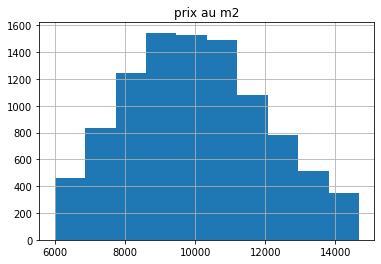

In [16]:
print("Histogramme des prix au m²")
_ = paris_df.hist(column="prix au m2")

Et des arrondissements :

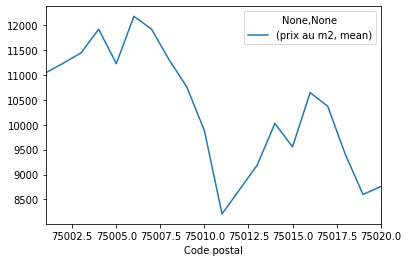

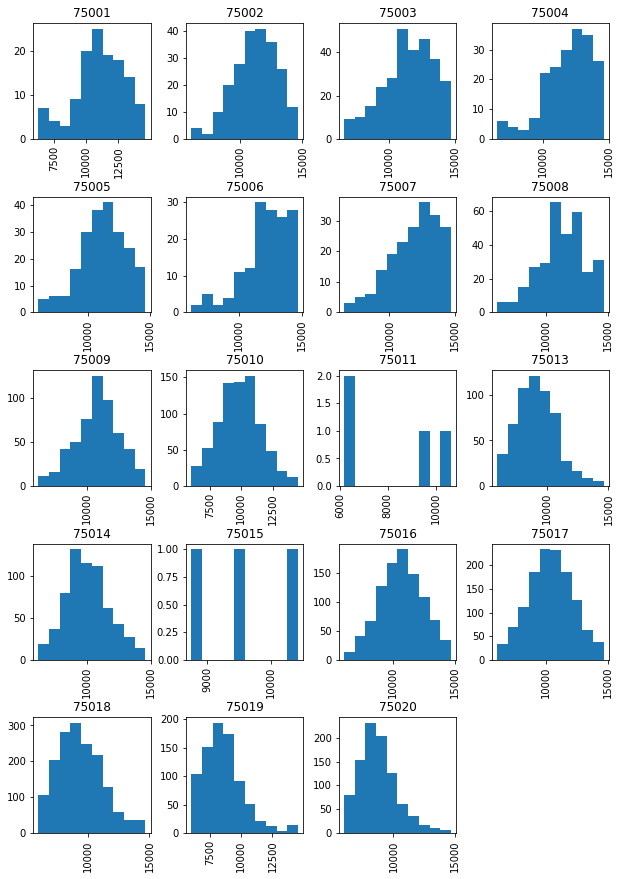

In [17]:
paris_df.groupby(["Code postal"])[["prix au m2"]].agg(["mean"]).plot()
_= paris_df.hist(column="prix au m2", by=["Code postal"], figsize=(10,15))

Outre la variation des prix par arrondissement, qui colle bien avec le marché immobilier, on remarque deux choses :

1.   la répartition des prix dans chaque arrondissement semble bien normalement distribuée
2.   on manque de données pour le 11e et 15e arrondissement

Regardons pour finir le classement des arrondissements du plus onéreux au moins cher :



In [19]:
#print(paris_df.groupby(["Code postal"])[["prix au m2"]].agg(["count"]))
print("Classement des arrondissements par prix au m²:")
print(paris_df.groupby(["Code postal"])[["prix au m2"]].agg(["mean"]).sort_values(by=("prix au m2", "mean"), ascending=False))

Classement des arrondissements par prix au m²:
               prix au m2
                     mean
Code postal              
75006        12183.507036
75007        11923.554018
75004        11922.425332
75003        11445.654636
75008        11306.318345
75002        11242.132714
75005        11229.863695
75001        11046.673743
75009        10762.189302
75016        10647.888236
75017        10371.260105
75014        10027.269957
75010         9881.946961
75015         9556.090909
75018         9400.682803
75013         9191.243453
75020         8755.158697
75019         8599.068373
75011         8207.280654


<a id='p2'> </a>

##2- Géocoding

Pour commencer des modélisations allant au delà des attributs statistiques standards, il est nécessaire d'enrichir les données pour leur ajouter une composante spatiale exploitable.

On s'appuie ici sur l'API Mapquest pour transformer les adresses en coordonnées UTM.

Comme précédemment, on peut passer cette étape en uploadant directement le résultat s'il est disponible

In [0]:
all_loc = get_all_location_string(paris_df)

###Complet (passer si upload possible)
Requête des données sur MapQuest

In [0]:
#import os
#if not os.path.exists("batches"):
#  os.mkdir("batches")

#key = input("input API key: \n")
#url = "http://www.mapquestapi.com/geocoding/v1/batch"

#def submit_data(locations):
#    """ Use mapquest api to request GPS coordinates from the address
#    """
#    dico = {"maxResults":1, "location":locations, "key":key}
#    req = requests.get(url, params=dico)
#    return json.loads(req.text)['results']
#   
#def batch_maker(loc_list, batch_size=100):
#  """ generate batches of batch_size adresses to feed the batch API
#  """
#  n_batch = int(ceil(len(loc_list) / batch_size))
#  for k_batch in range(n_batch):
#    yield loc_list[k_batch*batch_size:min((k_batch+1)*batch_size, len(loc_list))]
#
#for kb, batch in enumerate(batch_maker(all_loc)):
#  gps_loc = submit_data(batch)
#  latlong = [ a["locations"][0]["latLng"] for a in gps_loc]
#  batch_lat = [a["lat"] for a in latlong]
#  batch_long = [a["lng"] for a in latlong]
#  batch_df=pd.DataFrame({"location":batch, "lat":batch_lat, "long":batch_long})
#  batch_df.to_pickle("batches/batch_{}.pkl".format(kb))
#  
#blist = os.listdir("batches")
#all_df = None
#for bfile in blist:
#  batch_df = pd.read_pickle("batches/"+bfile)
#  if all_df is None:
#    all_df = batch_df
#  else:
#    all_df = pd.concat((all_df, batch_df), ignore_index=True)
#all_df.to_pickle("paris_unique_locations_df.pkl")

### Upload

In [23]:
import pickle
!wget "https://drive.google.com/uc?authuser=0&id=0B8DmBFYNDLqeUXNlc2c3QXRrMjdfUUczT2JTaU5XbUczU29J&export=download" -O paris_unique_locations_df.pikl
fn = "paris_unique_locations_df.pikl"
try:
  with open(fn, 'rb') as file:
    all_df = pickle.load(file)
  print("{name} loaded correctly as {type}".format(name=fn, type=type(all_df)))
except Exception as exc:
  print("failed to load {} (not a pickle ?)".format(fn))
  raise exc

--2019-12-27 14:27:28--  https://drive.google.com/uc?authuser=0&id=0B8DmBFYNDLqeUXNlc2c3QXRrMjdfUUczT2JTaU5XbUczU29J&export=download
Resolving drive.google.com (drive.google.com)... 173.194.217.138, 173.194.217.113, 173.194.217.139, ...
Connecting to drive.google.com (drive.google.com)|173.194.217.138|:443... connected.
HTTP request sent, awaiting response... 302 Moved Temporarily
Location: https://drive.google.com/uc?id=0B8DmBFYNDLqeUXNlc2c3QXRrMjdfUUczT2JTaU5XbUczU29J&export=download [following]
--2019-12-27 14:27:28--  https://drive.google.com/uc?id=0B8DmBFYNDLqeUXNlc2c3QXRrMjdfUUczT2JTaU5XbUczU29J&export=download
Reusing existing connection to drive.google.com:443.
HTTP request sent, awaiting response... 302 Moved Temporarily
Location: https://doc-0g-3s-docs.googleusercontent.com/docs/securesc/ha0ro937gcuc7l7deffksulhg5h7mbp1/9qhf0mu9dk9oildd7vhuqjn9u8queco7/1577455200000/15299445038170435910/*/0B8DmBFYNDLqeUXNlc2c3QXRrMjdfUUczT2JTaU5XbUczU29J?e=download [following]
--2019-12-27 14

<a id='p3'> </a>

### Visualisation


Pour la visualisation, on commence par projeter les lat/long en UTM WebM, puis on fusionne les adresses et les coordonnées géograpgiques

/usr/local/lib/python3.6/dist-packages/pyproj/crs.py:77: FutureWarning: '+init=<authority>:<code>' syntax is deprecated. '<authority>:<code>' is the preferred initialization method.
  return _prepare_from_string(" ".join(pjargs))
/usr/local/lib/python3.6/dist-packages/pandas/core/computation/expressions.py:194: UserWarning: evaluating in Python space because the '*' operator is not supported by numexpr for the bool dtype, use '&' instead
  op=op_str, alt_op=unsupported[op_str]


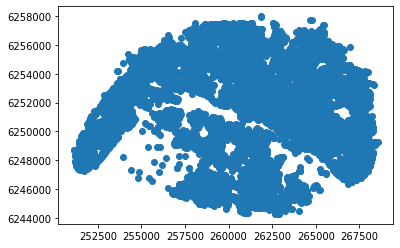

In [29]:
#projection web mercator
projo = Proj(init='epsg:3857')
selec = remove_out(all_df["long"], nsigma=10)[1] * remove_out(all_df["lat"], nsigma=10)[1]
x, y = projo(all_df["long"][selec].values, all_df["lat"][selec].values)
lo, la = all_df["long"][selec].values, all_df["lat"][selec].values
plt.scatter(x, y)

On a bien quelque chose qui ressemble à Paris.
On intègre maintenant ces coordonnées à la base de valeurs immobilières:

In [30]:
paris_df["location"] = paris_df.apply(line_to_location_string, axis=1)
all_df = all_df[selec]
all_df["X"] = x
all_df["Y"] = y


paris_df = pd.merge(paris_df, all_df,  on="location", how="inner")

paris_df.sample(3)

,surface,prix,Type de voie,Voie,Code postal,Type local,Code departement,Commune,No voie,prix au m2,location,lat_x,long_x,X_x,Y_x,lat_y,long_y,X_y,Y_y,lat,long,X,Y
4560,90.0,740000.0,RUE,DE BUZENVAL,75020,Appartement,75,PARIS 20,54.0,8222.222222,"France, PARIS 20, 75020, 54 RUE DE BUZENVAL",48.85206,2.40137,267319.285606,6.249796e+06,48.85206,2.40137,267319.285606,6.249796e+06,48.85206,2.40137,267319.285606,6.249796e+06
4951,89.0,552310.0,RUE,CURIAL,75019,Appartement,75,PARIS 19,7.0,6205.730337,"France, PARIS 19, 75019, 7 RUE CURIAL",48.89037,2.37163,264008.643950,6.256280e+06,48.89037,2.37163,264008.643950,6.256280e+06,48.89037,2.37163,264008.643950,6.256280e+06
5403,25.0,284400.0,RUE,DU PONCEAU,75002,Appartement,75,PARIS 02,3.0,11376.000000,"France, PARIS 02, 75002, 3 RUE DU PONCEAU",48.86671,2.35197,261820.102761,6.252275e+06,48.86671,2.35197,261820.102761,6.252275e+06,48.86671,2.35197,261820.102761,6.252275e+06


Les données sont prêtes !

On créé un plot interactif avec Bokeh :

In [31]:
x, y, p = paris_df["X"].values, paris_df["Y"].values, paris_df["prix au m2"].values
selec = (x>0) * (y>0)
x = x[selec]
y = y[selec]
p = p[selec]

x_range, y_range = ((min(x),max(x)), (min(y),max(y)))

### Plotting

plot_width  = int(750)
plot_height = int(plot_width//1.2)
def base_plot(tools='pan,wheel_zoom,reset',plot_width=plot_width, plot_height=plot_height, **plot_args):
  """ setup a bokeh plot
  """
  p = figure(tools=tools, plot_width=plot_width, plot_height=plot_height,
      x_range=x_range, y_range=y_range, outline_line_color=None,
      min_border=0, min_border_left=0, min_border_right=0,
      min_border_top=0, min_border_bottom=0, **plot_args)

  p.axis.visible = False
  p.xgrid.grid_line_color = None
  p.ygrid.grid_line_color = None
  p.add_tools(BoxZoomTool(match_aspect=True))
  return p


pl = base_plot()
pl.add_tile(CARTODBPOSITRON)
subsamp=1
source = ColumnDataSource(data={
    'x' : x[::subsamp],
    'y' : y[::subsamp],
    'address':paris_df["location"][selec][::subsamp],
    'prix':paris_df["prix au m2"][selec][::subsamp],
    'surface':paris_df["surface"][selec][::subsamp],
    'color':[
    "#%02x%02x%02x" % (int(p*255), int(p*255), int(p*255)) for p in (1-(p[::subsamp]-p.min())/(p.max()-p.min()))
]
})

pl.circle(x="x", y="y", fill_color="color", source=source)
pl.add_tools(HoverTool(
    tooltips=[
        ( 'address', '@address'      ), 
        ( 'prix', '@prix{i} € au m²'      ),
        ('surface', '@surface m²')
    ]))

show(pl)

<a id='p4'> </a>

### Modélisation


Pour modéliser les données, on utilise une régression par vecteur de support avec noyau gaussien.

Le paramètre gamma nous permet de jouer sur le lissage géographique du modèle



In [32]:
scaler = StandardScaler()

feature = scaler.fit_transform(np.array([x, y]).T)
target = p

clf = SVR(kernel='rbf', gamma=10, C=100
          , epsilon=500, max_iter=-1)
clf.fit(feature, target) 


SVR(C=100, cache_size=200, coef0=0.0, degree=3, epsilon=500, gamma=10,
    kernel='rbf', max_iter=-1, shrinking=True, tol=0.001, verbose=False)

Voyons à quoi ressemble notre modèle :

In [0]:
nsamp = 400
x_reg = np.linspace(x.min(), x.max(), nsamp)
y_reg = np.linspace(y.min(), y.max(), nsamp)
xx, yy = np.meshgrid(x_reg, y_reg)
pp = griddata((x,y), p, (xx,yy))

pp = clf.predict(scaler.transform(np.array([np.ravel(xx), np.ravel(yy)]).T))
pp.shape = (nsamp,nsamp)


pl=base_plot()
pl.add_tile(CARTODBPOSITRON)
pl.image(image=[pp], x=x.min(), y=y.min(),  dw=x.max()-x.min(), dh=y.max()-y.min(), global_alpha=0.3, palette="Spectral11")
pl.add_tools(HoverTool(
    tooltips=[
        ( 'prix', '@image{i} €'      ),
    ]))
show(pl)

### Visualisation interactive avec datashader

(work in progress)

In [33]:
!pip3 install datashader

     |████████████████████████████████| 15.5MB 307kB/s 
     |████████████████████████████████| 81kB 9.1MB/s 
     |████████████████████████████████| 1.6MB 32.3MB/s 
     |████████████████████████████████| 71kB 8.5MB/s 
  Created wheel for datashape: filename=datashape-0.5.2-cp36-none-any.whl size=59428 sha256=50a85c07b2bdcdfcde0eae0d94fad4d4e50603d7b0717f41e6e253c8a77e5c59
  Stored in directory: /root/.cache/pip/wheels/8d/06/05/c1cba3d57bdcfd3960e3f60a9fdc97e4baef2ef09af0ad1ef8
  Created wheel for locket: filename=locket-0.2.0-cp36-none-any.whl size=4039 sha256=f96d3534dfb7c78f0708424542083d186613e69e856015de8d0fdf24b9bde5a0
  Stored in directory: /root/.cache/pip/wheels/26/1e/e8/4fa236ec931b1a0cdd61578e20d4934d7bf188858723b84698
Successfully built datashape locket


In [34]:
import datashader as ds
import datashader.transfer_functions as tf
from datashader.colors import colormap_select, Greys9
from colorcet import fire, rainbow 

cvs = ds.Canvas(plot_width=25, plot_height=25, x_range=x_range, y_range=y_range)
agg = cvs.points(paris_df, 'X', 'Y', ds.mean('prix au m2'))
xc = np.linspace(agg.coords["X"].min(), agg.coords["X"].max(), 1000)
yc = np.linspace(agg.coords["Y"].min(), agg.coords["Y"].max(), 1000)
aggi=agg.interp(dict(Y=yc, X=xc), method='linear')
imgi = tf.shade(aggi, cmap=rainbow)

pl=base_plot()
pl.add_tile(CARTODBPOSITRON)
pl.image(image=[aggi.values], x=x.min(), y=y.min(),  dw=x.max()-x.min(), dh=y.max()-y.min(), global_alpha=0.3, palette="Spectral11")
pl.add_tools(HoverTool(
    tooltips=[
        ( 'prix', '@image{i} €'      ),
    ]))
show(pl)
